In [1]:
%load_ext autoreload
%autoreload 2
import tqdm, tqdm.notebook

tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path
import numpy as np

from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_exhaustive,
)
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

# Setup

We begin by defining some paths and configurations:

- `images`: points to the directory containing the reference images we will use for 3D mapping.
- `outputs`: an output directory where we will store results like detected features, matches, and the final reconstruction.
- `feature_conf` and `matcher_conf`: specify how to **extract features** and **match** them. For instance, `"disk"` refers to a deep-learning-based local feature extraction method, while `"lightglue"` is a matching method that uses learned correspondences.

The extracted features are saved into an HDF5 file (`features.h5`), and their matches are stored in another HDF5 file (`matches.h5`). These configurations streamline the process, letting us switch between different feature-extraction and matching backends without modifying the underlying code. 



In [2]:
images = Path("datasets/Kavli_Dataset-full/Kavli_Dataset/")
outputs = Path("outputs/m03/")
!rm -rf $outputs
sfm_pairs = outputs / "pairs-sfm.txt"
loc_pairs = outputs / "pairs-loc.txt"
sfm_dir = outputs / "sfm"
features = outputs / "features.h5"
matches = outputs / "matches.h5"

feature_conf = extract_features.confs["disk"]
matcher_conf = match_features.confs["disk+lightglue"]

# Listing Reference Images

Here we list the images in our `datasets/front-door/` folder. These serve as our **reference** or **mapping** images. The 3D reconstruction will be built from these images alone.

When you see code like this:

428 mapping images


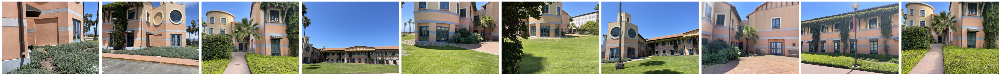

In [7]:
import random

# We simply gather all the file paths and convert them into a form that is easier to handle
references = [p.relative_to(images).as_posix() for p in images.iterdir()]
print(len(references), "mapping images")

# Randomly select 50 images from the references
references = random.sample(references, 200)

# `plot_images` is just for visualization, to ensure we are using the correct images
plot_images([read_image(images / r) for r in references[:10]], dpi=75)

In [8]:
len(references), "images selected for reconstruction"

(200, 'images selected for reconstruction')

# Direct Linear Transform (DLT) and the Camera Projection Matrix

Before diving into feature extraction, matching, and SfM, let’s ground ourselves in a fundamental approach: the **Direct Linear Transform (DLT)** for computing a **Camera Projection Matrix** $ \mathbf{P} $.

### The Camera Projection Matrix $ \mathbf{P} $
A pinhole camera model can be represented by a $ 3 \times 4 $ projection matrix $ \mathbf{P} $. For a 3D point in homogeneous coordinates $ \mathbf{X} = (X, Y, Z, 1)^\top $, the image projection $ \mathbf{x} = (x, y, 1)^\top $ is given by:
$$
\mathbf{x} \sim \mathbf{P} \, \mathbf{X}.
$$
Here, $ \sim $ denotes equality up to a scale factor, due to the nature of homogeneous coordinates.

### Why 12 Unknowns?
Since $ \mathbf{P} $ is $ 3 \times 4 $, naively, there are $ 3 \times 4 = 12 $ entries (unknowns). However, because only the scale of $ \mathbf{P} $ matters in homogeneous coordinates, we effectively have $ 11 $ degrees of freedom (1 of those 12 parameters is not independently determinable).

### Implementing DLT
Given $ n $ correspondences between 3D points $ \mathbf{X}_i $ and their 2D projections $ \mathbf{x}_i $, we can form a system of linear equations to solve for the entries of $ \mathbf{P} $. For each correspondence $ \mathbf{x}_i \leftrightarrow \mathbf{X}_i $, we can write:
$$
\begin{bmatrix}
0 & 0 & 0 & 0 & -\mathbf{X}_i^\top & y_i \mathbf{X}_i^\top \\
\mathbf{X}_i^\top & 0 & 0 & 0 & 0 & -x_i \mathbf{X}_i^\top
\end{bmatrix}
\begin{bmatrix}
p_{1,1} \\ p_{1,2} \\ p_{1,3} \\ p_{1,4} \\ p_{2,1} \\ \vdots \\ p_{3,4}
\end{bmatrix} = 
\begin{bmatrix}
0 \\
0
\end{bmatrix}.
$$
Stacking $ n $ such correspondences yields a matrix system $ \mathbf{A}\,\mathbf{p} = \mathbf{0} $, where $ \mathbf{p} $ is the vector of unknowns in $ \mathbf{P} $. We solve $ \mathbf{p} $ up to a scale factor by finding the **eigenvector** of $ \mathbf{A}^\top \mathbf{A} $ associated with its **smallest eigenvalue** (or by using SVD, etc.).

### Why This Matters for SfM
In modern **Structure-from-Motion** pipelines, a more robust pose estimation often uses nonlinear optimization (e.g., bundle adjustment) instead of a single DLT pass. However, the **DLT** approach is a cornerstone of projective geometry: it lets us quickly approximate \$ \mathbf{P} $ or $ \mathbf{R}, \mathbf{t}, \mathbf{K} $ (camera intrinsic/extrinsic parameters) from sufficient 2D–3D correspondences.




# Feature Extraction and Matching

The core part of our pipeline is to detect and describe local features, then match them across image pairs.

1. **Feature Extraction** (via `extract_features.main`): 
   - Detects keypoints in each image. 
   - Computes a descriptor vector for each keypoint.
   - We typically aim for **repeatability** (the same point in the scene should be detected in multiple images under different viewpoints or lighting conditions) and **distinctiveness** (allowing us to discriminate one point from another).
   - In classical methods (e.g., SIFT or ORB), descriptors are based on gradient orientations. In learned methods (e.g., `disk` here), a neural network provides the descriptors, often offering greater robustness.

2. **Matching** (via `match_features.main`): 
   - Given two sets of descriptors, we match them by finding correspondences that minimize descriptor distance.
   - These raw matches often contain outliers, so a robust estimation step (e.g., RANSAC) attempts to fit a geometric model (e.g., a **Fundamental matrix** \(F\) or **Homography** \(H\)) that is consistent with the majority of inliers.
   - **Fundamental Matrix** \(F\): relates corresponding points in two images of a 3D scene. A pair of matching image points $$\mathbf{x}, \mathbf{x}'$$ satisfies 
     $$
       \mathbf{x}'^\top \, F \, \mathbf{x} = 0,
     $$
     where $$\mathbf{x}, \mathbf{x}'$$ are in homogeneous coordinates. 
   - **Homography** \(H\): used if the scene is planar or the camera undergoes only planar motions. A match $$\mathbf{x} \leftrightarrow \mathbf{x}'$$ must satisfy
     $$
       \mathbf{x}' \sim H \, \mathbf{x}.
     $$

Because our scene has only a small number of images, we can **exhaustively** match all pairs without worrying about efficiency too much. For larger scenes, you would rely on image retrieval to narrow down candidate pairs.


In [9]:
extract_features.main(
    feature_conf, images, image_list=references, feature_path=features
)
pairs_from_exhaustive.main(sfm_pairs, image_list=references)
match_features.main(matcher_conf, sfm_pairs, features=features, matches=matches)

[2025/05/09 21:35:02 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


  0%|          | 0/180 [00:00<?, ?it/s]

[2025/05/09 21:35:48 hloc INFO] Finished exporting features.
[2025/05/09 21:35:48 hloc INFO] Found 19900 pairs.
[2025/05/09 21:35:48 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}


  0%|          | 0/19710 [00:00<?, ?it/s]

[2025/05/09 21:49:49 hloc INFO] Finished exporting matches.


PosixPath('outputs/m03/matches.h5')

# Structure-from-Motion (SfM) and 3D Reconstruction

Once we have robust matches between images, we can run **incremental SfM**. This process attempts to:

1. Initialize a base reconstruction from a pair of views (and the 2D matches between them).
2. Incrementally add new images (views), solving for their camera poses by aligning new matches with the already-triangulated 3D points.
3. **Triangulate** new 3D points from each newly added image pair and re-optimize (bundle adjustment).

Mathematically, if we have correspondences $ \mathbf{x}_i \leftrightarrow \mathbf{X} $ where $ \mathbf{x}_i $ is the projection of 3D point $ \mathbf{X} $ onto the $ i $ -th image, the **projection equation** can be written as:

$$
\mathbf{x}_i \sim \mathbf{K}_i \, [\mathbf{R}_i \mid \mathbf{t}_i] \, \mathbf{X},
$$

where $ \mathbf{K}_i $ is the intrinsic calibration matrix of the $ i $-th camera, and $ [\mathbf{R}_i \mid \mathbf{t}_i] $ are its extrinsic parameters (rotation and translation). SfM solves for these parameters and the 3D point positions $ \mathbf{X} $ by minimizing the **reprojection error**, i.e.,

$$
\min_{\mathbf{R}_i, \mathbf{t}_i, \mathbf{X}} 
\sum_{i, j} \| \mathbf{x}_i^j - \pi(\mathbf{R}_i, \mathbf{t}_i, \mathbf{X}^j) \|^2,
$$

where $ \mathbf{x}_i^j $ is the $ j $-th keypoint in the $ i $-th image and $ \pi(\cdot) $ is the camera projection function.

After running SfM, the code displays a plot of the recovered 3D points. The `mean_reprojection_error` is an indicator of the quality of our reconstruction, with lower values indicating better alignment. If the error is too high, it may suggest issues such as erroneous matches, incorrect intrinsics, or insufficient overlap between images.


In [ ]:
model = reconstruction.main(
    sfm_dir, images, sfm_pairs, features, matches, image_list=references
)
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(
    fig, model, color="rgba(255,0,0,0.5)", name="mapping", points_rgb=True
)
fig.show()

[2025/05/09 21:50:30 hloc WARNING] The database already exists, deleting it.
[2025/05/09 21:50:30 hloc INFO] Creating an empty database...
[2025/05/09 21:50:30 hloc INFO] Importing images into the database...
[2025/05/09 21:50:53 hloc INFO] Importing features into the database...


  0%|          | 0/200 [00:00<?, ?it/s]

[2025/05/09 21:50:53 hloc INFO] Importing matches into the database...


  0%|          | 0/19900 [00:00<?, ?it/s]

[2025/05/09 21:51:09 hloc INFO] Performing geometric verification of the matches...
I20250509 21:51:09.284601 140357064693504 misc.cc:44] 
Feature matching
I20250509 21:51:09.286374 140357073086208 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286381 140357081478912 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286392 140357056300800 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286498 140366029989632 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286607 140366021596928 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286711 140366013204224 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286806 140366004811520 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286820 140365996418816 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286857 140365988026112 sift.cc:1432] Creating SIFT CPU feature matcher
I20250509 21:51:09.286939 14036563

I20250509 21:51:32.627940 140357064693504 feature_matching.cc:46] in 3.344s
I20250509 21:51:32.638476 140357064693504 pairing.cc:775] Matching block [7/17]
I20250509 21:51:36.365182 140357064693504 feature_matching.cc:46] in 3.727s
I20250509 21:51:36.375189 140357064693504 pairing.cc:775] Matching block [8/17]
I20250509 21:51:40.057140 140357064693504 feature_matching.cc:46] in 3.682s
I20250509 21:51:40.082546 140357064693504 pairing.cc:775] Matching block [9/17]
I20250509 21:51:43.548904 140357064693504 feature_matching.cc:46] in 3.466s
I20250509 21:51:43.570558 140357064693504 pairing.cc:775] Matching block [10/17]
I20250509 21:51:47.168584 140357064693504 feature_matching.cc:46] in 3.598s
I20250509 21:51:47.187408 140357064693504 pairing.cc:775] Matching block [11/17]
I20250509 21:51:51.838665 140357064693504 feature_matching.cc:46] in 4.651s
I20250509 21:51:51.850119 140357064693504 pairing.cc:775] Matching block [12/17]
I20250509 21:51:54.907753 140357064693504 feature_matching.cc

# Localization

After building our 3D map, we can now **localize** a new query image against it. Localization means we want to find the **camera pose** of this new image in the coordinate system defined by our existing 3D reconstruction. This is crucial for many applications, such as augmented reality or robot navigation, where a new image’s position and orientation must be estimated in a known environment.

Below, we:
1. Select a **query image** (one we have not used in the 3D mapping).
2. Extract local features for that query image.
3. Generate pairs (query vs. reference images) and match them.
4. Use these matches, along with the 3D model, to estimate the query’s pose.


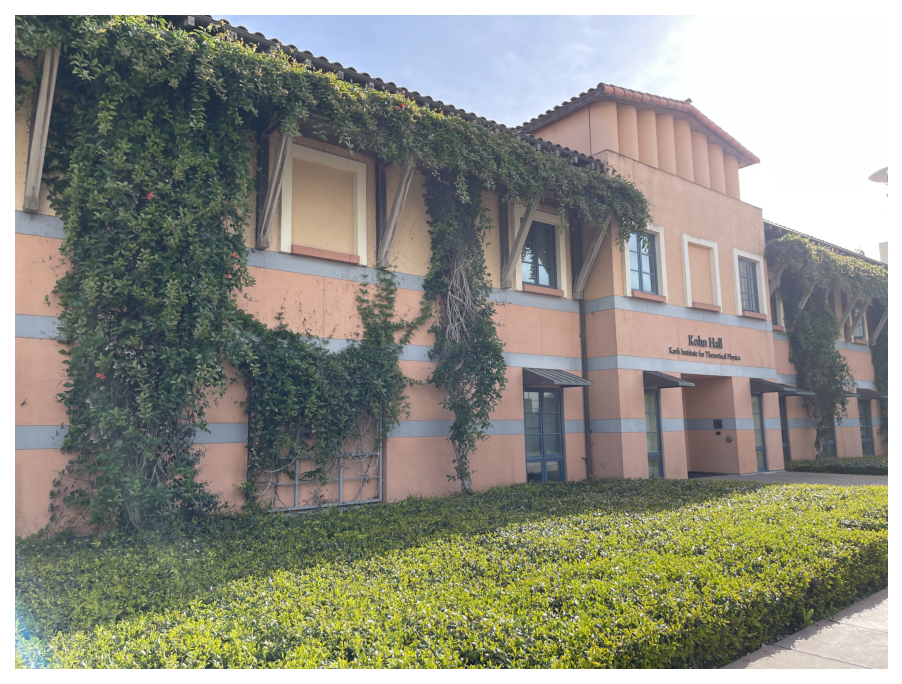

In [7]:
### Query Image Inspection
# Here, we specify the path to our query image, then display it to verify we’re using the correct file. 
# This step just confirms the visual content of the query image, ensuring that it aligns with what we expect to localize against the 3D map.

query = "../query/IMG_1199.JPG"
# !mkdir -p $images/query 
plot_images([read_image(images / query)], dpi=150)

# Feature Extraction for the Query Image

We run the same feature extraction pipeline (`extract_features.main`) on the query image that we used for the reference (mapping) images. Consistency in feature extraction is vital: the descriptor type and parameters must match those used to build the map. Any mismatch in feature settings could lead to inconsistent descriptors and poor matching results.

1. **Overwrite** is set to `True` because we’re adding or recomputing features for the query image inside the same `.h5` file used by the references.
2. We then generate pairs (`pairs_from_exhaustive.main`) between the query and the references. Since there is only one query image, the pairs simply pair the query with each reference.
3. Finally, we match those pairs (`match_features.main`) so that we can identify correspondences between the query's descriptors and the reference images’ descriptors.


In [17]:
extract_features.main(
    feature_conf, images, image_list=[query], feature_path=features, overwrite=True
)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references)
match_features.main(
    matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True
);

[2025/04/02 11:38:50 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


  0%|          | 0/1 [00:00<?, ?it/s]

[2025/04/02 11:38:51 hloc INFO] Finished exporting features.
[2025/04/02 11:38:51 hloc INFO] Found 10 pairs.
[2025/04/02 11:38:51 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}


  0%|          | 0/10 [00:00<?, ?it/s]

[2025/04/02 11:38:51 hloc INFO] Finished exporting matches.


# Estimating the Query Pose

Now that we have matches between the query image and the reference images, we can solve for the query’s camera pose in the existing 3D map. We read the EXIF data of the query to infer a rough initial estimate of camera parameters like the focal length. Then we estimate the absolute camera pose using PnP+RANSAC and refine the camera parameters.

1. **Infer the Query Camera**: We use `pycolmap.infer_camera_from_image(...)` to guess the camera intrinsics for the query image based on metadata or image size.
2. **Reference IDs**: We identify which images in the 3D reconstruction serve as references by retrieving their image IDs from the COLMAP model.
3. **Localization**: The `QueryLocalizer` uses the matched keypoints and the 3D map to estimate the pose of the query. Essentially, it associates 2D points in the query image with known 3D points in the reconstruction, then uses a robust solver (e.g., PnP with RANSAC) to find the camera position and orientation.
4. **Pose Refinement**: We optionally refine intrinsics (like focal length) to improve alignment. The `max_error` threshold in RANSAC (`12` pixels) allows for some outliers without rejecting too many inliers.

We then print out how many inlier correspondences were found. This inlier ratio is a proxy for how well the query matches the existing model. The better the inlier ratio, the more certain we can be in the pose estimate.


found 66/222 inlier correspondences.


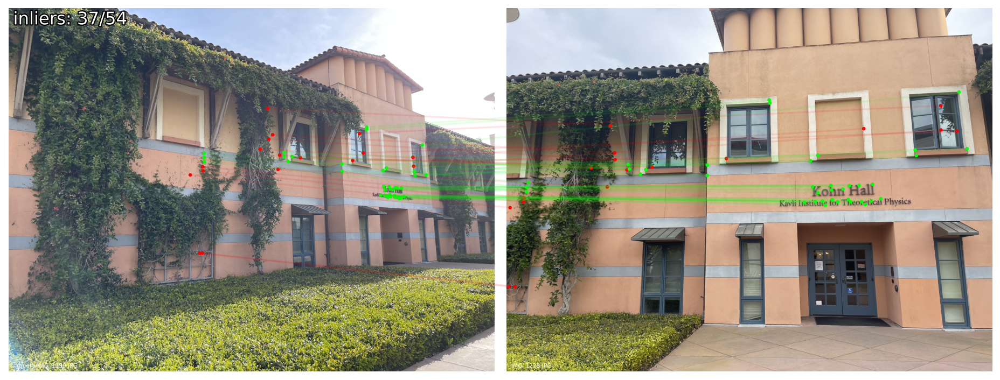

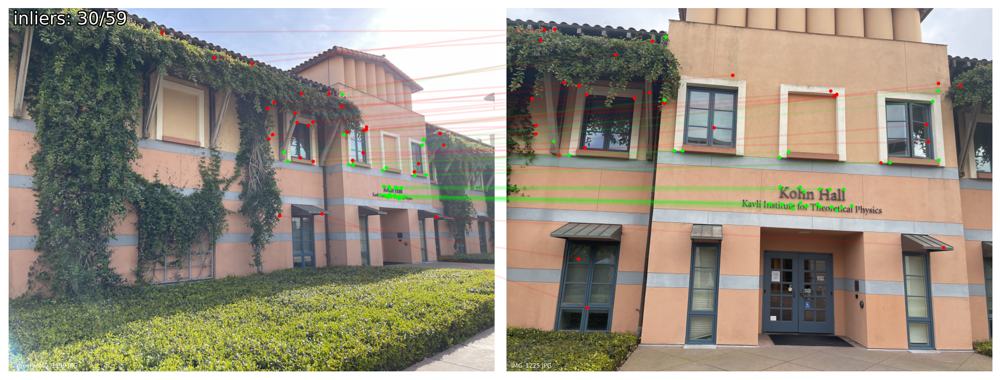

In [18]:
import pycolmap
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

camera = pycolmap.infer_camera_from_image(images / query)
ref_ids = [model.find_image_with_name(r).image_id for r in references]
conf = {
    "estimation": {"ransac": {"max_error": 12}},
    "refinement": {"refine_focal_length": True, "refine_extra_params": True},
}
localizer = QueryLocalizer(model, conf)
ret, log = pose_from_cluster(localizer, query, camera, ref_ids, features, matches)
ret['inliers'] = ret.pop('inlier_mask')
print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
visualization.visualize_loc_from_log(images, query, log, model, dpi=155)

# Visualizing the Localized Query

Having computed the camera pose, we can visualize it in the 3D model. We visualize the correspondences between the query images a few mapping images. We can also visualize the estimated camera pose in the 3D map.

1. **Add the Query Camera**: We create a new `pycolmap.Image` object that describes the query’s rotation and translation in the same coordinate frame as the original model.
2. **Plot the Camera**: We overlay the query camera on our 3D figure (`viz_3d.plot_camera_colmap`). A different color (e.g., __GREEN__) helps us distinguish the query camera from the mapping cameras.
3. **2D-3D Correspondences**: We extract the 3D coordinates of the inlier matches (`inl_3d`) and plot them. These are points in the scene that the algorithm used to pin down the query’s location. Seeing them helps confirm that the query aligns with known points in the map.
4. Finally, we display the figure with `fig.show()`, revealing our complete 3D scene along with the newly localized camera.



In [20]:
pose = pycolmap.Image(cam_from_world=ret["cam_from_world"])
viz_3d.plot_camera_colmap(
    fig, pose, camera, color="rgba(0,255,0,0.5)", name=query, fill=True
)
# visualize 2D-3D correspodences
inl_3d = np.array(
    [model.points3D[pid].xyz for pid in np.array(log["points3D_ids"])[ret["inliers"]]]
)
viz_3d.plot_points(fig, inl_3d, color="lime", ps=1, name=query)
fig.show()

---

# Guassian Splatting
#### Milestone 4

For your project, you will take everything you did above and now use Guassian Splatting to reconstruct the 3D scene. Here are a few fun examples, both with varying degrees of good enough and amazing.

- https://jefftan969.github.io/3dgs/wriva-pi-1/0018b19d11c3dbbdcea0bede66ec77f83e2885e7/index.html
- https://projects.markkellogg.org/threejs/gaussian_splats_3d_demos/garden.html?mode=1